In [1]:
from __future__ import absolute_import, division, print_function, unicode_literals

In [2]:
try:
  !pip install tensorflow_datasets
  !pip install scikit-learn
  !pip install urllib3
  !pip install Pillow
  !pip install tensorflow
except Exception:
  pass

In [3]:
import tensorflow as tf
AUTOTUNE = tf.data.experimental.AUTOTUNE
import IPython.display as display
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import os
import zipfile
import pathlib

In [4]:
tf.__version__

'2.1.0'

# Data preprocessing

In [5]:
dataset_name = "DDC Prison BLM"

# if not os.path.exists('Dataset'):
#     os.mkdir('Dataset')
    
# with zipfile.ZipFile(dataset_name + ".zip","r") as zip_ref:
#     zip_ref.extractall("Dataset")

In [6]:
data_dir = pathlib.Path("Dataset/" + dataset_name)
data_dir

WindowsPath('Dataset/DDC Prison BLM')

In [7]:
image_count = len(list(data_dir.glob('*/*.jpg')))
image_count

3541

In [8]:
CLASS_NAMES = np.array([item.name for item in data_dir.glob('*') if item.name != ".DS_Store"])
CLASS_NAMES

array(['AB-NA', 'AB-NS', 'ABS-NS', 'ABS-NTB', 'ABS-TB', 'ABS-U', 'N',
       'NS'], dtype='<U7')

In [9]:
normal = list(data_dir.glob('N/*'))

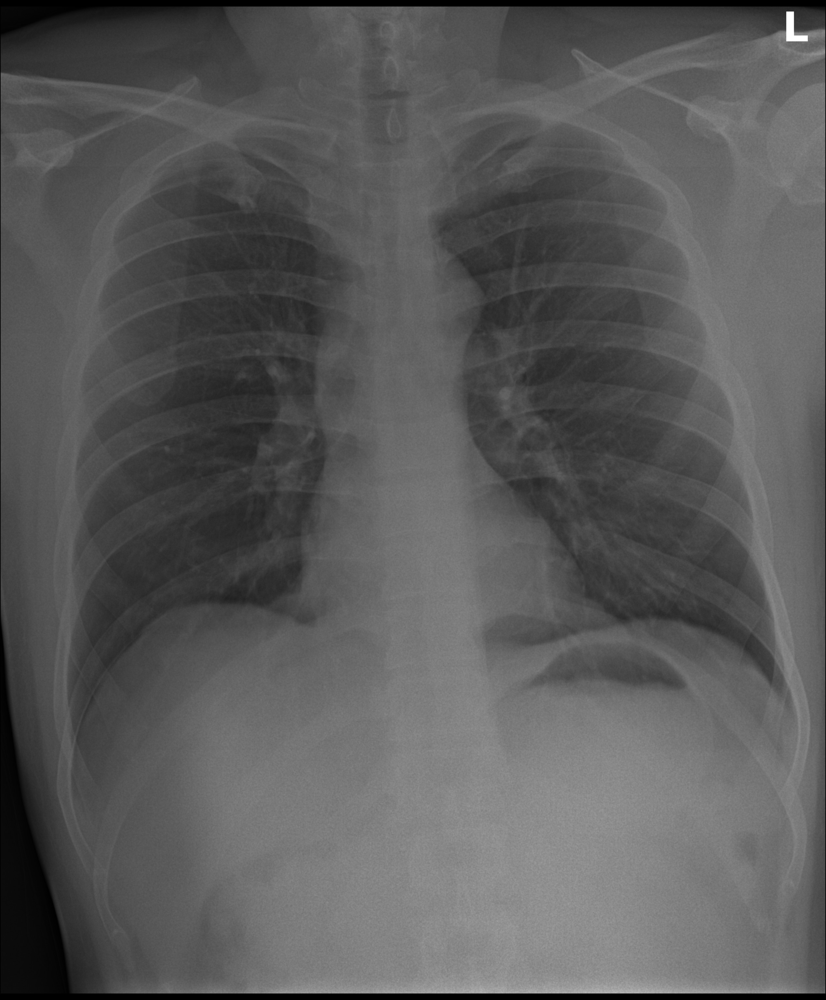

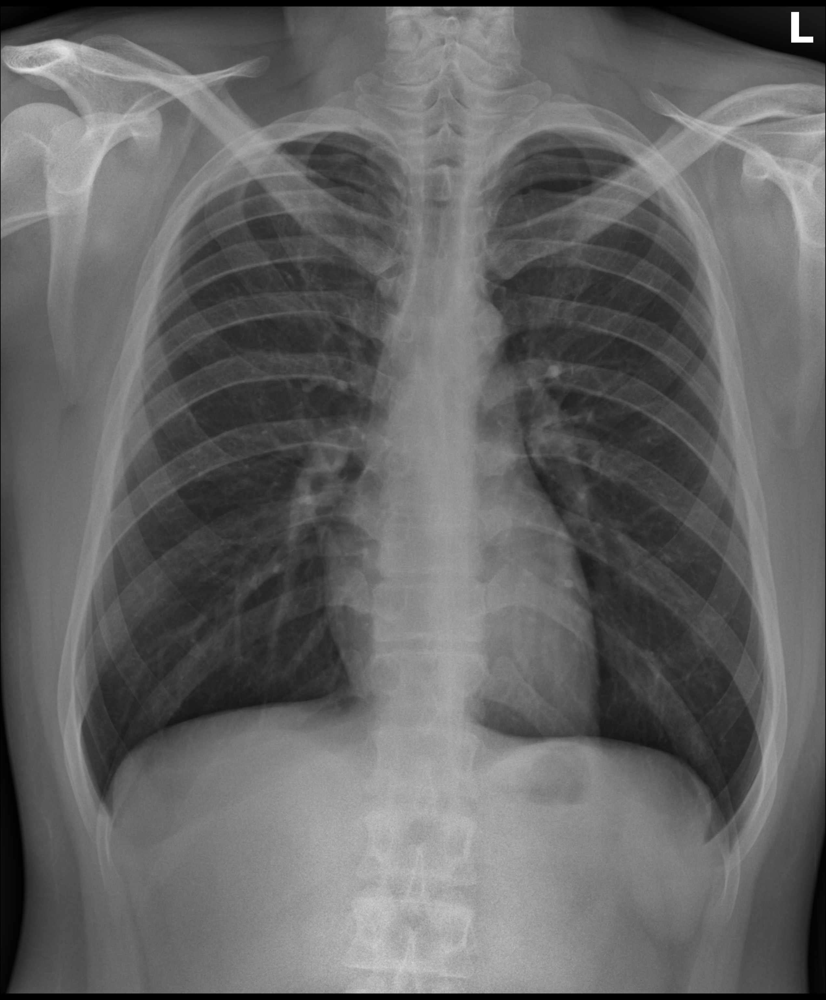

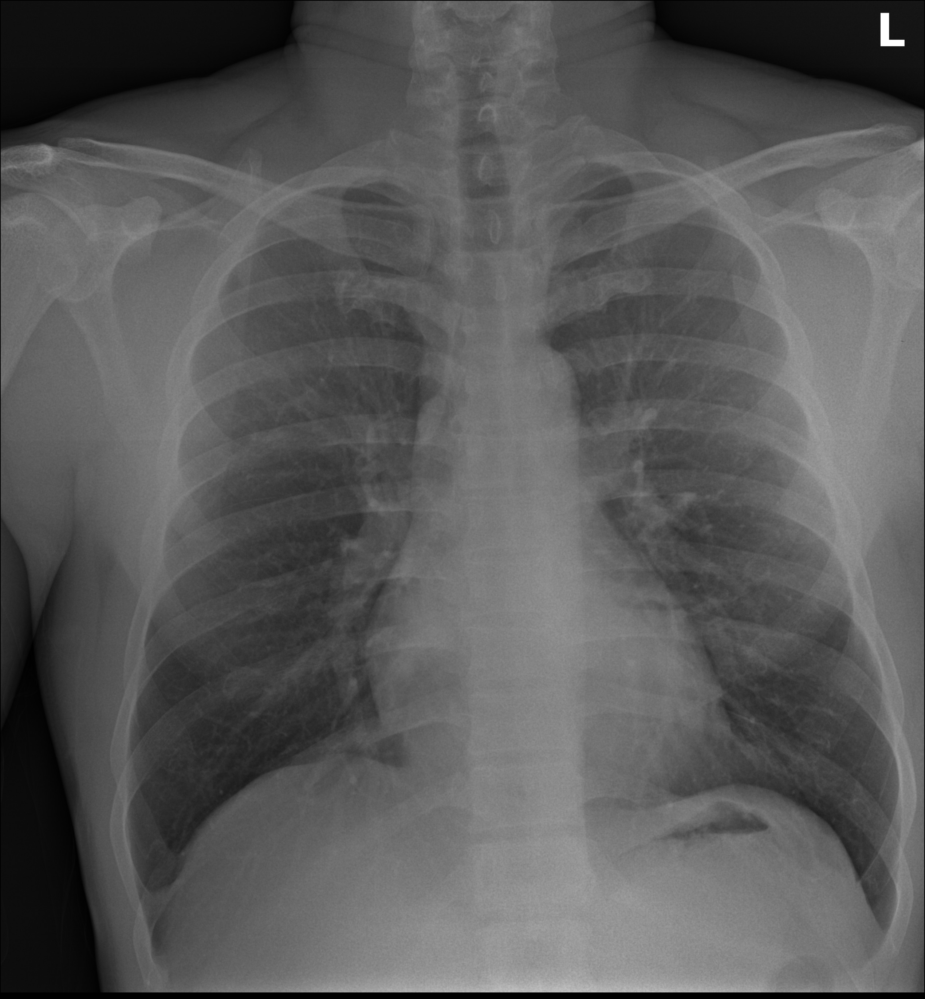

In [10]:
for image_path in normal[:3]:
    display.display(Image.open(str(image_path)))

In [11]:
image_generator = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1./255)

In [12]:
BATCH_SIZE = 32
SHUFFLE_BUFFER_SIZE = 1000
IMG_HEIGHT = 224
IMG_WIDTH = 224
STEPS_PER_EPOCH = np.ceil(image_count/BATCH_SIZE)

In [13]:
list_ds = tf.data.Dataset.list_files(str(data_dir/'*/*.jpg'))

In [14]:
for f in list_ds.take(5):
    print(f.numpy())

b'Dataset\\DDC Prison BLM\\N\\001608539.jpg'
b'Dataset\\DDC Prison BLM\\N\\001342104.jpg'
b'Dataset\\DDC Prison BLM\\ABS-NS\\000711692.jpg'
b'Dataset\\DDC Prison BLM\\N\\001466415.jpg'
b'Dataset\\DDC Prison BLM\\N\\000184791.jpg'


In [15]:
CLASS_NAMES

array(['AB-NA', 'AB-NS', 'ABS-NS', 'ABS-NTB', 'ABS-TB', 'ABS-U', 'N',
       'NS'], dtype='<U7')

In [16]:
def get_label(file_path):
  # convert the path to a list of path components
    parts = tf.strings.split(file_path, os.path.sep)
  # The second to last is the class-directory
    return parts[-2] == CLASS_NAMES

In [17]:
def decode_img(img):
  # convert the compressed string to a 3D uint8 tensor
  img = tf.image.decode_jpeg(img, channels=3)
  # Use `convert_image_dtype` to convert to floats in the [0,1] range.
  img = tf.image.convert_image_dtype(img, tf.float32)
  # img = tf.cast(img, tf.float32)
  # resize the image to the desired size.
  return tf.image.resize(img, [IMG_WIDTH, IMG_HEIGHT])

In [18]:
def process_path(file_path):
    label = get_label(file_path)
    # load the raw data from the file as a string
    img = tf.io.read_file(file_path)
    img = decode_img(img)
    return img, label

In [19]:
# Set `num_parallel_calls` so multiple images are loaded/processed in parallel.
labeled_ds = list_ds.map(process_path, num_parallel_calls=AUTOTUNE)

In [20]:
for image, label in labeled_ds.take(2):
    print("Image shape: ", image.numpy().shape)
    print("Label: ", label.numpy())

Image shape:  (224, 224, 3)
Label:  [False False False False False False False  True]
Image shape:  (224, 224, 3)
Label:  [False False False False False False  True False]


In [21]:
def prepare_for_training(ds, cache=True, shuffle_buffer_size=1000):
  # This is a small dataset, only load it once, and keep it in memory.
  # use `.cache(filename)` to cache preprocessing work for datasets that don't
  # fit in memory.
    if cache:
        if isinstance(cache, str):
              ds = ds.cache(cache)
        else:
              ds = ds.cache()

        ds = ds.shuffle(buffer_size=shuffle_buffer_size)

        # Repeat forever
    ds = ds.repeat()

    ds = ds.batch(BATCH_SIZE)

  # `prefetch` lets the dataset fetch batches in the background while the model
  # is training.
    ds = ds.prefetch(buffer_size=AUTOTUNE)
    return ds

In [22]:
train_ds = prepare_for_training(labeled_ds)

In [23]:
train_size = int(0.7 * image_count)
validation_size = int(0.15 * image_count)
test_size = int(0.15 * image_count)

train_dataset = train_ds.take(train_size)
test_dataset = train_ds.skip(train_size)
validation_dataset = test_dataset.skip(test_size)
test_dataset = test_dataset.take(test_size)

In [24]:
def show_batch(image_batch, label_batch):
    plt.figure(figsize=(10,10))
    for n in range(25):
        ax = plt.subplot(5,5,n+1)
        plt.imshow(image_batch[n])
        plt.title(CLASS_NAMES[label_batch[n]==1][0].title())
        plt.axis('off')

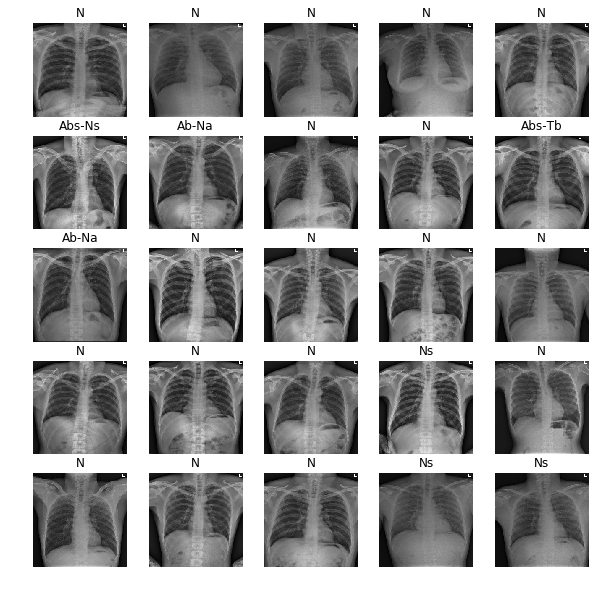

In [25]:
train_image_batch, train_label_batch = next(iter(train_dataset))
show_batch(train_image_batch.numpy(), train_label_batch.numpy())

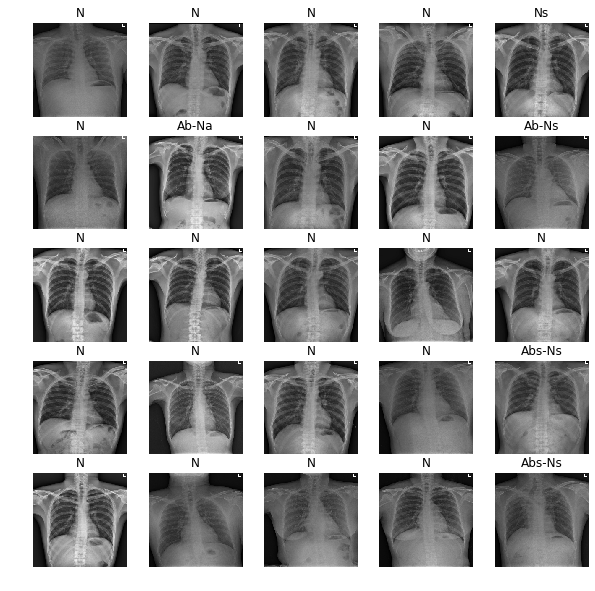

In [26]:
validation_image_batch, validation_label_batch = next(iter(validation_dataset))
show_batch(validation_image_batch.numpy(), validation_label_batch.numpy())

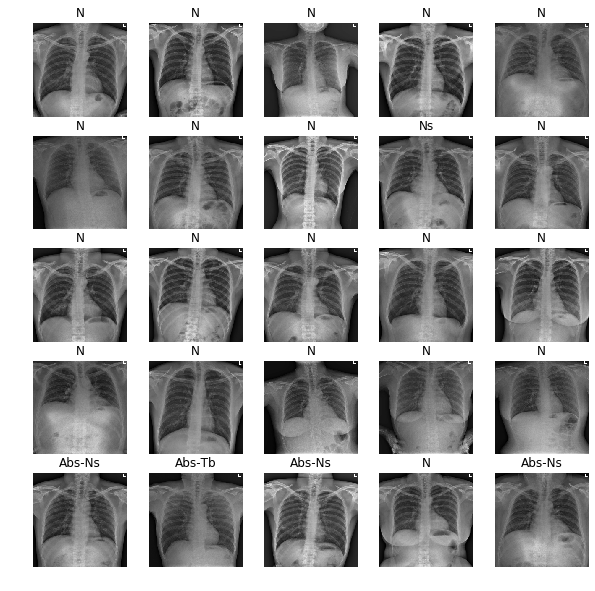

In [27]:
test_image_batch, test_label_batch = next(iter(test_dataset))
show_batch(test_image_batch.numpy(), test_label_batch.numpy())

# Training

In [28]:
train_batches = train_dataset.shuffle(SHUFFLE_BUFFER_SIZE)
validation_batches = validation_dataset
test_batches = test_dataset

In [29]:
for image_batch, label_batch in train_batches.take(1):
   pass

image_batch.shape

TensorShape([32, 224, 224, 3])

In [30]:
IMG_SHAPE = (IMG_HEIGHT, IMG_WIDTH, 3)

# Create the base model from the pre-trained model MobileNet V2
base_model = tf.keras.applications.MobileNetV2(input_shape=IMG_SHAPE,
                                               include_top=False,
                                               weights='imagenet')


# base_model = tf.keras.applications.inception_resnet_v2.InceptionResNetV2(
#                 include_top=True, 
#                 weights='imagenet', 
#                 input_shape=IMG_SHAPE, 
#                 pooling=None, 
#                 classes=1000)

In [31]:
feature_batch = base_model(image_batch)
print(feature_batch.shape)

(32, 7, 7, 1280)


In [32]:
base_model.trainable = False

In [33]:
base_model.summary()

Model: "mobilenetv2_1.00_224"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
Conv1_pad (ZeroPadding2D)       (None, 225, 225, 3)  0           input_1[0][0]                    
__________________________________________________________________________________________________
Conv1 (Conv2D)                  (None, 112, 112, 32) 864         Conv1_pad[0][0]                  
__________________________________________________________________________________________________
bn_Conv1 (BatchNormalization)   (None, 112, 112, 32) 128         Conv1[0][0]                      
_______________________________________________________________________________

In [34]:
global_average_layer = tf.keras.layers.GlobalAveragePooling2D()
feature_batch_average = global_average_layer(feature_batch)
print(feature_batch_average.shape)

(32, 1280)


In [35]:
#prediction_layer = tf.keras.layers.Dense(2,activation="softmax")
prediction_layer = tf.keras.layers.Dense(len(CLASS_NAMES),activation="softmax")

prediction_batch = prediction_layer(feature_batch_average)
print(prediction_batch.shape)

(32, 8)


In [36]:
model = tf.keras.Sequential([
  base_model,
  global_average_layer,
  prediction_layer
])

In [103]:
base_learning_rate = 0.00001
model.compile(optimizer=tf.keras.optimizers.Adam(lr=base_learning_rate),
#               loss='binary_crossentropy',
                loss='categorical_crossentropy',
                metrics=['accuracy'])

In [104]:
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
mobilenetv2_1.00_224 (Model) (None, 7, 7, 1280)        2257984   
_________________________________________________________________
global_average_pooling2d (Gl (None, 1280)              0         
_________________________________________________________________
dense (Dense)                (None, 8)                 10248     
Total params: 2,268,232
Trainable params: 1,872,840
Non-trainable params: 395,392
_________________________________________________________________


In [105]:
len(model.trainable_variables)

58

In [106]:
num_train = train_size
num_val = validation_size
num_test = test_size

In [107]:
num_train, num_val, num_test

(2478, 531, 531)

In [108]:
initial_epochs = 30
steps_per_epoch = round(num_train)//BATCH_SIZE
test_steps = round(num_test)//BATCH_SIZE
validation_steps = round(num_val)//BATCH_SIZE

loss0,accuracy0 = model.evaluate(validation_batches, steps = validation_steps)

16/16 [==============================] - 24s 2s/step - loss: 2.0802 - accuracy: 0.7246


In [109]:
print("initial loss: {:.2f}".format(loss0))
print("initial accuracy: {:.2f}".format(accuracy0))

initial loss: 2.08
initial accuracy: 0.72


In [110]:
history = model.fit(train_batches,
                    epochs=initial_epochs,
                    steps_per_epoch=steps_per_epoch,
                    validation_data=validation_batches,
                    validation_steps=validation_steps)

Train for 77 steps, validate for 16 steps
Epoch 1/30
77/77 [==============================] - 40s 517ms/step - loss: 2.2343e-04 - accuracy: 1.0000 - val_loss: 1.8947 - val_accuracy: 0.7402
Epoch 2/30
77/77 [==============================] - 31s 404ms/step - loss: 7.7602e-04 - accuracy: 0.9996 - val_loss: 2.1884 - val_accuracy: 0.7324
Epoch 3/30
77/77 [==============================] - 29s 375ms/step - loss: 8.3696e-04 - accuracy: 0.9992 - val_loss: 1.7963 - val_accuracy: 0.7480
Epoch 4/30
77/77 [==============================] - 28s 366ms/step - loss: 9.8085e-04 - accuracy: 0.9996 - val_loss: 2.0516 - val_accuracy: 0.7480
Epoch 5/30
77/77 [==============================] - 28s 368ms/step - loss: 0.0016 - accuracy: 0.9988 - val_loss: 1.9955 - val_accuracy: 0.7109
Epoch 6/30
77/77 [==============================] - 29s 373ms/step - loss: 3.7279e-04 - accuracy: 1.0000 - val_loss: 1.8771 - val_accuracy: 0.7422
Epoch 7/30
77/77 [==============================] - 28s 367ms/step - loss: 0.001

# Adam

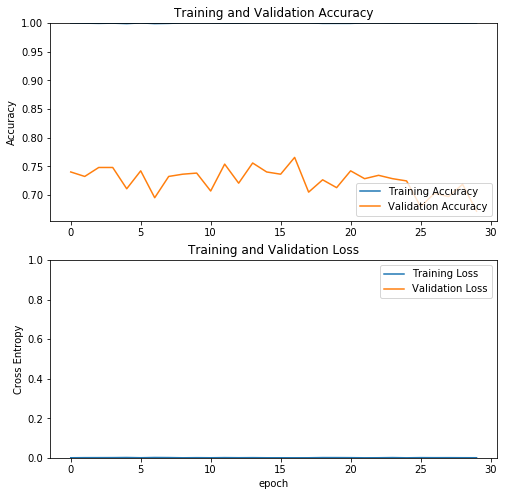

In [111]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(8, 8))
plt.subplot(2, 1, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy')

plt.subplot(2, 1, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([0,1.0])
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

# FINE TUNE

In [94]:
base_model.trainable = True

In [95]:
# Let's take a look to see how many layers are in the base model
print("Number of layers in the base model: ", len(base_model.layers))

# Fine tune from this layer onwards
fine_tune_at = 100

# Freeze all the layers before the `fine_tune_at` layer
for layer in base_model.layers[:fine_tune_at]:
  layer.trainable =  False

Number of layers in the base model:  155


In [96]:
model.compile(loss='categorical_crossentropy',
              optimizer = tf.keras.optimizers.Adam(lr=base_learning_rate/10),
              metrics=['accuracy'])

In [97]:
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
mobilenetv2_1.00_224 (Model) (None, 7, 7, 1280)        2257984   
_________________________________________________________________
global_average_pooling2d (Gl (None, 1280)              0         
_________________________________________________________________
dense (Dense)                (None, 8)                 10248     
Total params: 2,268,232
Trainable params: 1,872,840
Non-trainable params: 395,392
_________________________________________________________________


In [98]:
fine_tune_epochs = 10
total_epochs =  initial_epochs + fine_tune_epochs

# history_fine = model.fit(train_batches,
#                          epochs=total_epochs,
#                          initial_epoch =  history.epoch[-1],
#                          validation_data=validation_batches,
#                          validation_steps=validation_steps)

history_fine = model.fit(train_batches,
                    epochs=total_epochs,
                    initial_epoch =  history.epoch[-1],
                    steps_per_epoch=steps_per_epoch,
                    validation_data=validation_batches,
                    validation_steps=validation_steps)

Train for 77 steps, validate for 16 steps
Epoch 30/40
77/77 [==============================] - 40s 523ms/step - loss: 0.0042 - accuracy: 0.9980 - val_loss: 2.1030 - val_accuracy: 0.7520
Epoch 31/40
77/77 [==============================] - 29s 372ms/step - loss: 0.0026 - accuracy: 0.9992 - val_loss: 2.5685 - val_accuracy: 0.7383
Epoch 32/40
77/77 [==============================] - 29s 374ms/step - loss: 0.0036 - accuracy: 0.9988 - val_loss: 2.3370 - val_accuracy: 0.7461
Epoch 33/40
77/77 [==============================] - 29s 373ms/step - loss: 0.0012 - accuracy: 0.9996 - val_loss: 2.3413 - val_accuracy: 0.7383
Epoch 34/40
77/77 [==============================] - 28s 367ms/step - loss: 0.0014 - accuracy: 0.9996 - val_loss: 2.4559 - val_accuracy: 0.7324
Epoch 35/40
77/77 [==============================] - 28s 367ms/step - loss: 3.9996e-04 - accuracy: 1.0000 - val_loss: 2.5762 - val_accuracy: 0.7227
Epoch 36/40
77/77 [==============================] - 28s 359ms/step - loss: 0.0016 - accur

In [99]:
acc += history_fine.history['accuracy']
val_acc += history_fine.history['val_accuracy']

loss += history_fine.history['loss']
val_loss += history_fine.history['val_loss']

In [100]:
# !mkdir -p saved_model
model.save('saved_model/ddc_prison_blm_mobilenet2.h5')

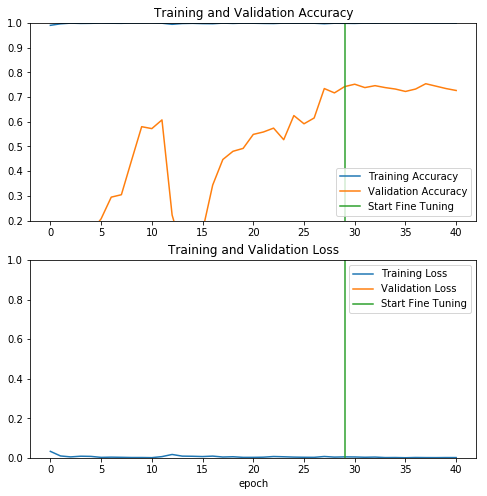

In [101]:
plt.figure(figsize=(8, 8))
plt.subplot(2, 1, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.ylim([0.2, 1])
plt.plot([initial_epochs-1,initial_epochs-1],
          plt.ylim(), label='Start Fine Tuning')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(2, 1, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.ylim([0, 1.0])
plt.plot([initial_epochs-1,initial_epochs-1],
         plt.ylim(), label='Start Fine Tuning')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

In [102]:
predict_model = tf.keras.models.load_model('saved_model/ddc_prison_blm_mobilenet.h5')
predict_model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
mobilenetv2_1.00_224 (Model) (None, 7, 7, 1280)        2257984   
_________________________________________________________________
global_average_pooling2d (Gl (None, 1280)              0         
_________________________________________________________________
dense (Dense)                (None, 8)                 10248     
Total params: 2,268,232
Trainable params: 1,872,840
Non-trainable params: 395,392
_________________________________________________________________


In [112]:
predictions = predict_model.predict(test_dataset)
print(predictions[3])

[0.05110436 0.08497011 0.23280312 0.00089994 0.06042692 0.01213936
 0.41093504 0.14672112]


In [67]:
print(predictions)

[[0.03076794 0.02130992 0.08230928 ... 0.00401106 0.7482519  0.06133815]
 [0.01368476 0.02204238 0.09680787 ... 0.00285252 0.74745244 0.07768804]
 [0.01169926 0.00735404 0.06482733 ... 0.00262122 0.8340135  0.06477644]
 ...
 [0.04560383 0.02892048 0.1164597  ... 0.00245298 0.65973043 0.10572954]
 [0.05033056 0.00939257 0.06792648 ... 0.00461571 0.7626326  0.06781182]
 [0.05000004 0.06483462 0.07649879 ... 0.0088888  0.6378555  0.10697816]]
